In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
import os 


In [13]:
files = os.listdir(r'D:\DA proj files\Uber Analysis')[-7:]
files

['uber-raw-data-apr14.csv',
 'uber-raw-data-aug14.csv',
 'uber-raw-data-janjune-15.csv',
 'uber-raw-data-jul14.csv',
 'uber-raw-data-jun14.csv',
 'uber-raw-data-may14.csv',
 'uber-raw-data-sep14.csv']

In [14]:
files.remove('uber-raw-data-janjune-15.csv')
files

['uber-raw-data-apr14.csv',
 'uber-raw-data-aug14.csv',
 'uber-raw-data-jul14.csv',
 'uber-raw-data-jun14.csv',
 'uber-raw-data-may14.csv',
 'uber-raw-data-sep14.csv']

In [15]:
path = r'D:\DA proj files\Uber Analysis'
final = pd.DataFrame()
for file in files:
    df = pd.read_csv(path + "/" + file, encoding = 'utf-8')
    final = pd.concat([df, final])

In [17]:

final.shape

(4534327, 4)

In [18]:
final.head()

,Date/Time,Lat,Lon,Base
0,9/1/2014 0:01:00,40.2201,-74.0021,B02512
1,9/1/2014 0:01:00,40.7500,-74.0027,B02512
2,9/1/2014 0:03:00,40.7559,-73.9864,B02512
3,9/1/2014 0:06:00,40.7450,-73.9889,B02512
4,9/1/2014 0:11:00,40.8145,-73.9444,B02512


In [19]:
df = final.copy()

In [20]:
df.head()

,Date/Time,Lat,Lon,Base
0,9/1/2014 0:01:00,40.2201,-74.0021,B02512
1,9/1/2014 0:01:00,40.7500,-74.0027,B02512
2,9/1/2014 0:03:00,40.7559,-73.9864,B02512
3,9/1/2014 0:06:00,40.7450,-73.9889,B02512
4,9/1/2014 0:11:00,40.8145,-73.9444,B02512


In [23]:
df.dtypes

Date/Time     object
Lat          float64
Lon          float64
Base          object
dtype: object

In [26]:
df ['Date/Time'] = pd.to_datetime(df['Date/Time'], format = '%m/%d/%Y %H:%M:%S')

In [27]:
df.dtypes

Date/Time    datetime64[ns]
Lat                 float64
Lon                 float64
Base                 object
dtype: object

In [28]:
df.head()

,Date/Time,Lat,Lon,Base
0,2014-09-01 00:01:00,40.2201,-74.0021,B02512
1,2014-09-01 00:01:00,40.7500,-74.0027,B02512
2,2014-09-01 00:03:00,40.7559,-73.9864,B02512
3,2014-09-01 00:06:00,40.7450,-73.9889,B02512
4,2014-09-01 00:11:00,40.8145,-73.9444,B02512


In [30]:
df['weekday'] = df['Date/Time'].dt.day_name()

In [31]:
df['day'] = df['Date/Time'].dt.day

In [32]:
df['minute'] = df['Date/Time'].dt.minute

In [33]:
df['month'] = df['Date/Time'].dt.month

In [34]:
df['hour'] = df['Date/Time'].dt.hour

In [35]:
df.head()

,Date/Time,Lat,Lon,Base,weekday,day,minute,month,hour
0,2014-09-01 00:01:00,40.2201,-74.0021,B02512,Monday,1,1,9,0
1,2014-09-01 00:01:00,40.7500,-74.0027,B02512,Monday,1,1,9,0
2,2014-09-01 00:03:00,40.7559,-73.9864,B02512,Monday,1,3,9,0
3,2014-09-01 00:06:00,40.7450,-73.9889,B02512,Monday,1,6,9,0
4,2014-09-01 00:11:00,40.8145,-73.9444,B02512,Monday,1,11,9,0


In [36]:
df.dtypes

Date/Time    datetime64[ns]
Lat                 float64
Lon                 float64
Base                 object
weekday              object
day                   int64
minute                int64
month                 int64
hour                  int64
dtype: object

## ANALYSING UBER JOURNIES PER WEEKDAYS

In [43]:
df['weekday'].value_counts()

Thursday     755145
Friday       741139
Wednesday    696488
Tuesday      663789
Saturday     646114
Monday       541472
Sunday       490180
Name: weekday, dtype: int64

In [38]:
!pip install plotly

In [40]:

import plotly.express as px

In [46]:
px.bar(x = df['weekday'].value_counts().index, y = df['weekday'].value_counts(),
      labels = dict(x = " Weekdays", y = " Uber bookings"))

## ANALYSING THE MAX. TRAFFIC ON ROAD BY HOUR

(array([216928., 103517., 227152., 543565., 324851., 366329., 819491.,
        660869., 579117., 692508.]),
 array([ 0. ,  2.3,  4.6,  6.9,  9.2, 11.5, 13.8, 16.1, 18.4, 20.7, 23. ]),
 <BarContainer object of 10 artists>)

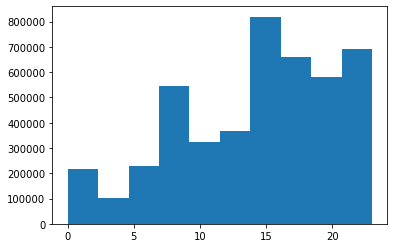

In [47]:
plt.hist(df['hour'])

In [48]:
df['month'].unique()

array([9, 5, 6, 7, 8, 4], dtype=int64)

In [51]:
for i, month in enumerate(df['month'].unique()):
    print(i," -", month)

0  - 9
1  - 5
2  - 6
3  - 7
4  - 8
5  - 4


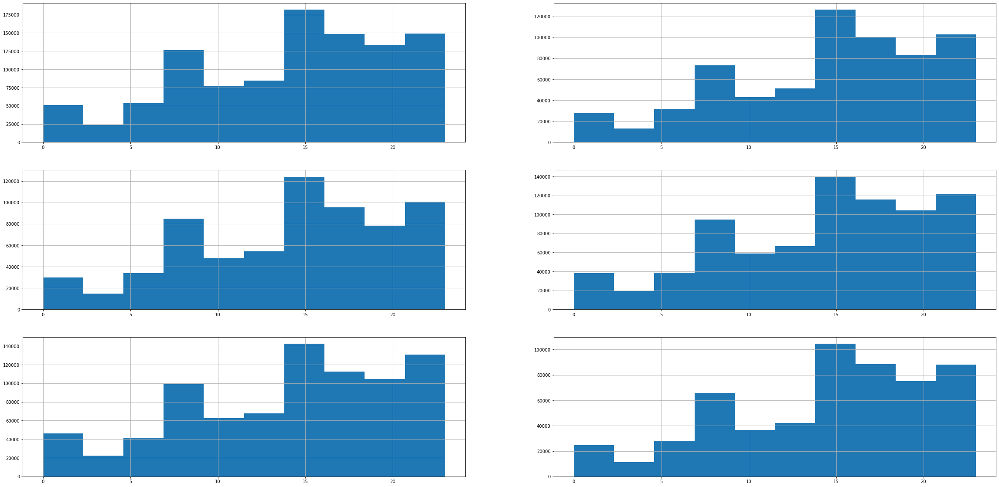

In [52]:
plt.figure(figsize = (40,20))

for i, month in enumerate(df['month'].unique()):
    plt.subplot(3,2,i + 1)
    df[df['month'] == month]['hour'].hist()

## ANALYSING WHICH MONTH HAS MAXIMUM RIDES

In [144]:
df.head()

,Date/Time,Lat,Lon,Base,weekday,day,minute,month,hour
0,2014-09-01 00:01:00,40.2201,-74.0021,B02512,Monday,1,1,9,0
1,2014-09-01 00:01:00,40.7500,-74.0027,B02512,Monday,1,1,9,0
2,2014-09-01 00:03:00,40.7559,-73.9864,B02512,Monday,1,3,9,0
3,2014-09-01 00:06:00,40.7450,-73.9889,B02512,Monday,1,6,9,0
4,2014-09-01 00:11:00,40.8145,-73.9444,B02512,Monday,1,11,9,0


In [145]:
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

In [146]:
!pip install chart_studio

In [147]:
import chart_studio.plotly as py 


In [148]:
df.groupby('month')['hour'].count()

month
4     564516
5     652435
6     663844
7     796121
8     829275
9    1028136
Name: hour, dtype: int64

In [149]:
trace1 = go.Bar(x = df.groupby('month')['hour'].count().index, y = df.groupby('month')['hour'].count(), name = 'Priority')
##plt.xlabel('months')  
##plt.ylabel('traffic in bookings')   ##labels = xaxis : "months", yaxis : "traffic in bookings"

In [150]:
iplot([trace1])

## ANALYSING JOURNIES OF EACH DAY

Text(0.5, 1.0, 'Journey by month end')

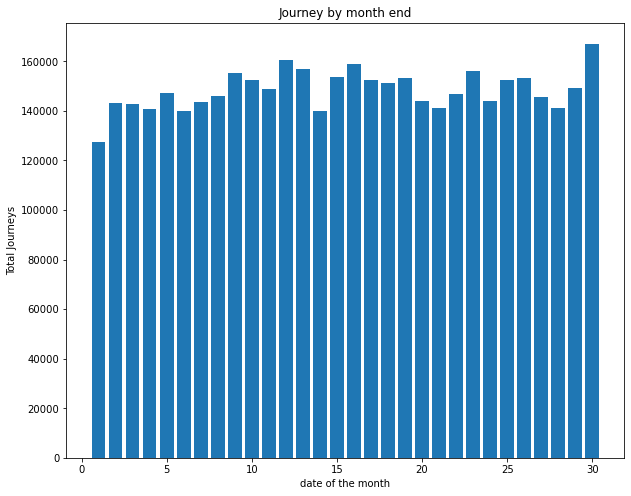

In [151]:
plt.figure(figsize = (10,8))
plt.hist(df['day'], bins = 30, rwidth = 0.8, range = (0.5, 30.5))
plt.xlabel('date of the month')
plt.ylabel('Total Journeys')
plt.title('Journey by month end')

<AxesSubplot:xlabel='day', ylabel='Count'>

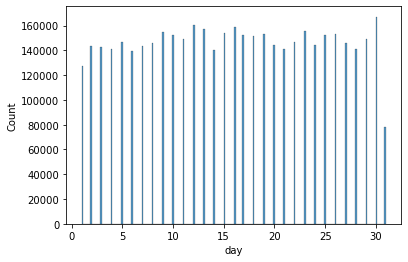

In [152]:
sns.histplot(df['day'])

## ANALYSING TOTAL RIDES MONTHLY


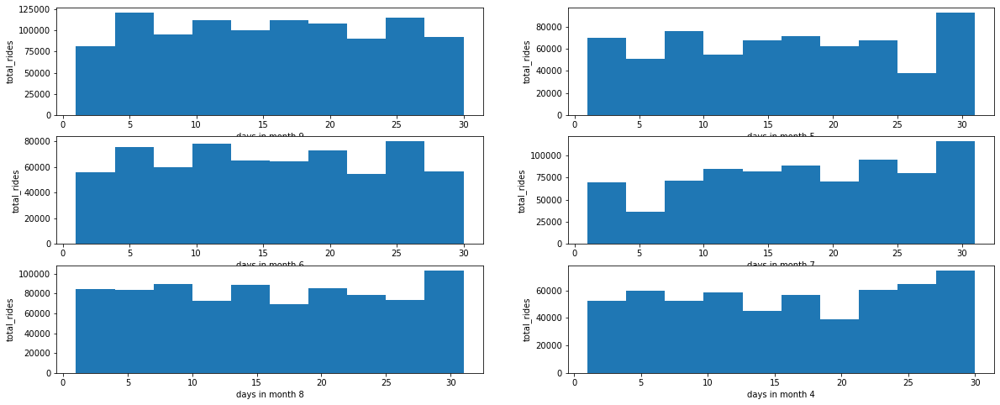

In [153]:
plt.figure(figsize = (20, 8))

for i, month in enumerate(df['month'].unique(),1):
    plt.subplot(3, 2, i)
    df_out = df[df['month'] == month]
    plt.hist(df_out['day'])
    plt.xlabel('days in month {}'.format(month))
    plt.ylabel('total_rides')

## ANALYSING TO FIND OUT THE RUSH HOUR

Text(0.5, 1.0, 'hour of day vs latitude of passenger')

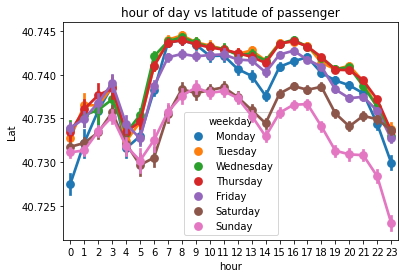

In [154]:
ax = sns.pointplot(x = 'hour',y = 'Lat', data = df, hue = 'weekday')
ax.set_title('hour of day vs latitude of passenger')

## ANALYSING WHICH BASE NO. IS MOST POPULAR

In [155]:
df.head()

,Date/Time,Lat,Lon,Base,weekday,day,minute,month,hour
0,2014-09-01 00:01:00,40.2201,-74.0021,B02512,Monday,1,1,9,0
1,2014-09-01 00:01:00,40.7500,-74.0027,B02512,Monday,1,1,9,0
2,2014-09-01 00:03:00,40.7559,-73.9864,B02512,Monday,1,3,9,0
3,2014-09-01 00:06:00,40.7450,-73.9889,B02512,Monday,1,6,9,0
4,2014-09-01 00:11:00,40.8145,-73.9444,B02512,Monday,1,11,9,0


In [156]:
base = df.groupby(['Base', 'month'])['Date/Time'].count().reset_index()
base

,Base,month,Date/Time
0,B02512,4,35536
1,B02512,5,36765
2,B02512,6,32509
3,B02512,7,35021
4,B02512,8,31472
5,B02512,9,34370
6,B02598,4,183263
7,B02598,5,260549
8,B02598,6,242975
9,B02598,7,245597


<AxesSubplot:xlabel='month', ylabel='Date/Time'>

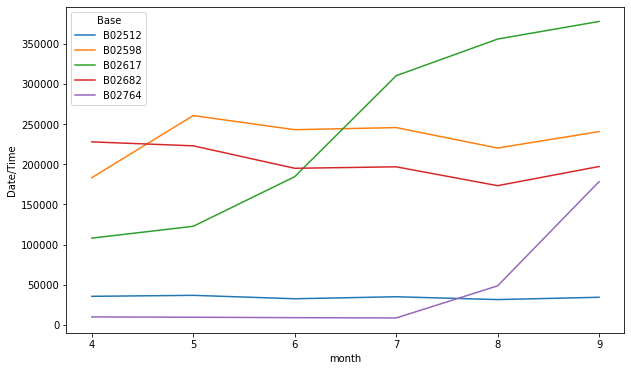

In [157]:
plt.figure(figsize = (10,6))
sns.lineplot(x = 'month', y = 'Date/Time', hue = 'Base', data = base)

## CROSS ANALYSIS USING HEATMAP

In [158]:
def count_rows(rows):
    return len(rows)

In [159]:
cross = df.groupby(['weekday','hour']).apply(count_rows)
cross

weekday    hour
Friday     0       13716
           1        8163
           2        5350
           3        6930
           4        8806
                   ...  
Wednesday  19      47017
           20      47772
           21      44553
           22      32868
           23      18146
Length: 168, dtype: int64

In [160]:
pivot = cross.unstack()
pivot

hour,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,21,22,23
weekday,,,,,,,,,,,,,,,,,,,,,
Friday,13716,8163,5350,6930,8806,13450,23412,32061,31509,25230,...,36206,43673,48169,51961,54762,49595,43542,48323,49409,41260
Monday,6436,3737,2938,6232,9640,15032,23746,31159,29265,22197,...,28157,32744,38770,42023,37000,34159,32849,28925,20158,11811
Saturday,27633,19189,12710,9542,6846,7084,8579,11014,14411,17669,...,31418,38769,43512,42844,45883,41098,38714,43826,47951,43174
Sunday,32877,23015,15436,10597,6374,6169,6596,8728,12128,16401,...,28151,31112,33038,31521,28291,25948,25076,23967,19566,12166
Thursday,9293,5290,3719,5637,8505,14169,27065,37038,35431,27812,...,36699,44442,50560,56704,55825,51907,51990,51953,44194,27764
Tuesday,6237,3509,2571,4494,7548,14241,26872,36599,33934,25023,...,34846,41338,48667,55500,50186,44789,44661,39913,27712,14869
Wednesday,7644,4324,3141,4855,7511,13794,26943,36495,33826,25635,...,35148,43388,50684,55637,52732,47017,47772,44553,32868,18146


<AxesSubplot:xlabel='hour', ylabel='weekday'>

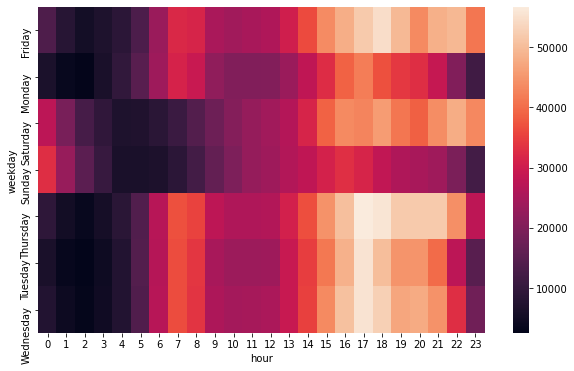

In [161]:
plt.figure(figsize = (10,6))
sns.heatmap(pivot)

In [162]:
def heatmap(col1, col2):
    cross = df.groupby([col1, col2]).apply(count_rows)
    pivot = cross.unstack()
    plt.figure(figsize = (10,6))
    return sns.heatmap(pivot)

    

<AxesSubplot:xlabel='hour', ylabel='day'>

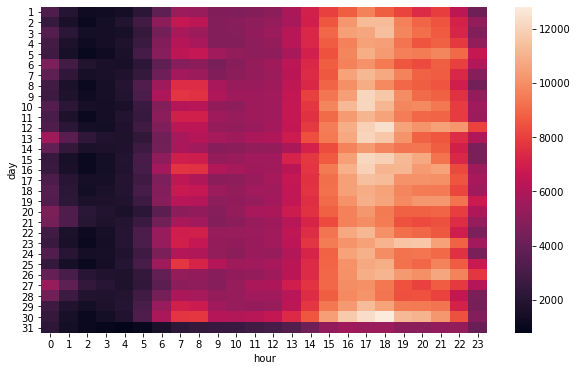

In [163]:
heatmap('day','hour')

<AxesSubplot:xlabel='day', ylabel='month'>

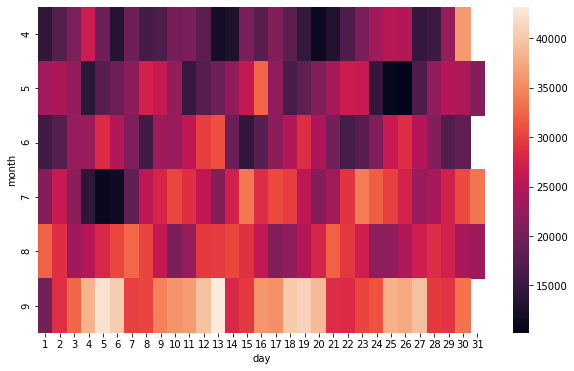

In [164]:
heatmap('month','day')

<AxesSubplot:xlabel='weekday', ylabel='month'>

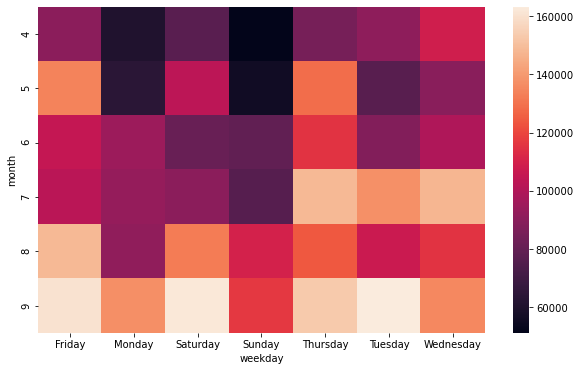

In [165]:
heatmap('month','weekday')

## ANALYSING LOCATION DATA POINTS


In [166]:
df.head()

,Date/Time,Lat,Lon,Base,weekday,day,minute,month,hour
0,2014-09-01 00:01:00,40.2201,-74.0021,B02512,Monday,1,1,9,0
1,2014-09-01 00:01:00,40.7500,-74.0027,B02512,Monday,1,1,9,0
2,2014-09-01 00:03:00,40.7559,-73.9864,B02512,Monday,1,3,9,0
3,2014-09-01 00:06:00,40.7450,-73.9889,B02512,Monday,1,6,9,0
4,2014-09-01 00:11:00,40.8145,-73.9444,B02512,Monday,1,11,9,0


(40.5, 41.0)

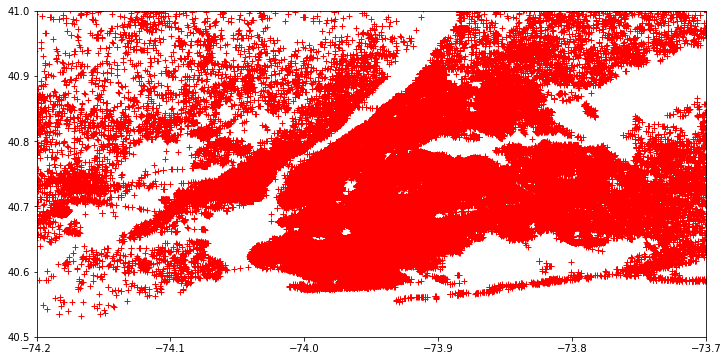

In [167]:
plt.figure(figsize = (12,6))
plt.plot(df['Lon'],df['Lat'], 'r+')
plt.xlim(-74.2, -73.7)
plt.ylim(40.5, 41)

## PERFORMING SPATIAL ANALYSIS USING HEATMAP

In [168]:
df_out = df[df['weekday'] == 'Sunday']

In [169]:
df_out.head()

,Date/Time,Lat,Lon,Base,weekday,day,minute,month,hour
8011,2014-09-07 00:00:00,40.7341,-74.0005,B02512,Sunday,7,0,9,0
8012,2014-09-07 00:00:00,40.7344,-73.9900,B02512,Sunday,7,0,9,0
8013,2014-09-07 00:00:00,40.7806,-73.9582,B02512,Sunday,7,0,9,0
8014,2014-09-07 00:01:00,40.7293,-73.9859,B02512,Sunday,7,1,9,0
8015,2014-09-07 00:01:00,40.7713,-74.0133,B02512,Sunday,7,1,9,0


In [170]:
rush = df_out.groupby(['Lat','Lon'])['weekday'].count().reset_index()
rush

,Lat,Lon,weekday
0,39.9374,-74.0722,1
1,39.9378,-74.0721,1
2,39.9384,-74.0742,1
3,39.9385,-74.0734,1
4,39.9415,-74.0736,1
...,...,...,...
209225,41.3141,-74.1249,1
209226,41.3180,-74.1298,1
209227,41.3195,-73.6905,1
209228,41.3197,-73.6903,1


In [171]:
rush.columns = ['Lat','Lon','no. of trips']

In [172]:
rush

,Lat,Lon,no. of trips
0,39.9374,-74.0722,1
1,39.9378,-74.0721,1
2,39.9384,-74.0742,1
3,39.9385,-74.0734,1
4,39.9415,-74.0736,1
...,...,...,...
209225,41.3141,-74.1249,1
209226,41.3180,-74.1298,1
209227,41.3195,-73.6905,1
209228,41.3197,-73.6903,1


In [173]:
!pip install folium

In [174]:
from folium.plugins import HeatMap

In [175]:
import folium


In [176]:
basemap = folium.Map()
basemap

In [177]:
HeatMap(rush,zoom = 20, radius = 15).add_to(basemap)
basemap

In [178]:
def plot(df,day):
    basemap = folium.Map()
    df_out = df[df['weekday'] == day]
    HeatMap(df_out.groupby(['Lat','Lon'])['weekday'].count().reset_index(),zoom = 20, radius = 15).add_to(basemap)
    return basemap

In [179]:
plot(df,'Saturday')

## ANALYSING UBER PICKUPS MONTH-WISE

In [180]:
uber15 = pd.read_csv(r'D:\DA proj files\Uber Analysis/uber-raw-data-janjune-15.csv')
uber15

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID
0,B02617,2015-05-17 09:47:00,B02617,141
1,B02617,2015-05-17 09:47:00,B02617,65
2,B02617,2015-05-17 09:47:00,B02617,100
3,B02617,2015-05-17 09:47:00,B02774,80
4,B02617,2015-05-17 09:47:00,B02617,90
...,...,...,...,...
14270474,B02765,2015-05-08 15:43:00,B02765,186
14270475,B02765,2015-05-08 15:43:00,B02765,263
14270476,B02765,2015-05-08 15:43:00,B02765,90
14270477,B02765,2015-05-08 15:44:00,B01899,45


In [181]:
uber15.dtypes

Dispatching_base_num    object
Pickup_date             object
Affiliated_base_num     object
locationID               int64
dtype: object

In [183]:
uber15['Pickup_date'] = pd.to_datetime(uber15['Pickup_date'], format = '%Y-%m-%d %H:%M:%S')

In [184]:
uber15.dtypes

Dispatching_base_num            object
Pickup_date             datetime64[ns]
Affiliated_base_num             object
locationID                       int64
dtype: object

In [185]:
uber15['weekday'] = uber15['Pickup_date'].dt.day_name()
uber15['day'] = uber15['Pickup_date'].dt.day
uber15['minute'] = uber15['Pickup_date'].dt.minute
uber15['month'] = uber15['Pickup_date'].dt.month
uber15['hour'] = uber15['Pickup_date'].dt.hour

In [186]:
uber15.head()

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID,weekday,day,minute,month,hour
0,B02617,2015-05-17 09:47:00,B02617,141,Sunday,17,47,5,9
1,B02617,2015-05-17 09:47:00,B02617,65,Sunday,17,47,5,9
2,B02617,2015-05-17 09:47:00,B02617,100,Sunday,17,47,5,9
3,B02617,2015-05-17 09:47:00,B02774,80,Sunday,17,47,5,9
4,B02617,2015-05-17 09:47:00,B02617,90,Sunday,17,47,5,9


In [188]:
month = px.bar(x = uber15['month'].value_counts().index, 
               y = uber15['month'].value_counts())
month

## ANALYSING NY RUSH

C:\Users\luvpr\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:xlabel='hour', ylabel='count'>

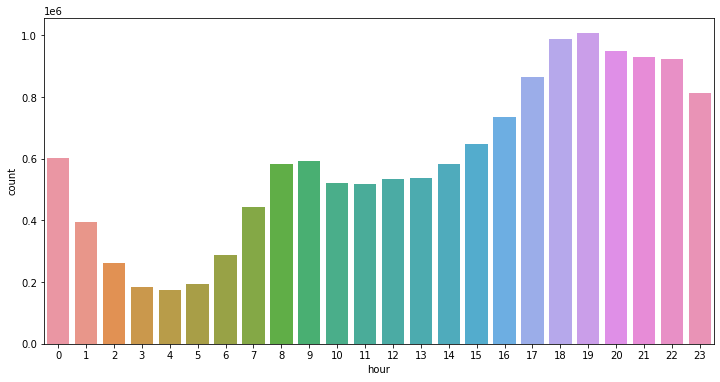

In [189]:
plt.figure(figsize = (12,6))
sns.countplot(uber15['hour'])


## RUSH DAY AND HOUR WISE

In [192]:
rush = uber15.groupby(['weekday','hour'])['Pickup_date'].count().reset_index()
rush

,weekday,hour,Pickup_date
0,Friday,0,85939
1,Friday,1,46616
2,Friday,2,28102
3,Friday,3,19518
4,Friday,4,23575
...,...,...,...
163,Wednesday,19,143751
164,Wednesday,20,136003
165,Wednesday,21,133993
166,Wednesday,22,127026


In [194]:
rush.columns = ['weekday','hour','count']
rush.head()

,weekday,hour,count
0,Friday,0,85939
1,Friday,1,46616
2,Friday,2,28102
3,Friday,3,19518
4,Friday,4,23575


<AxesSubplot:xlabel='hour', ylabel='count'>

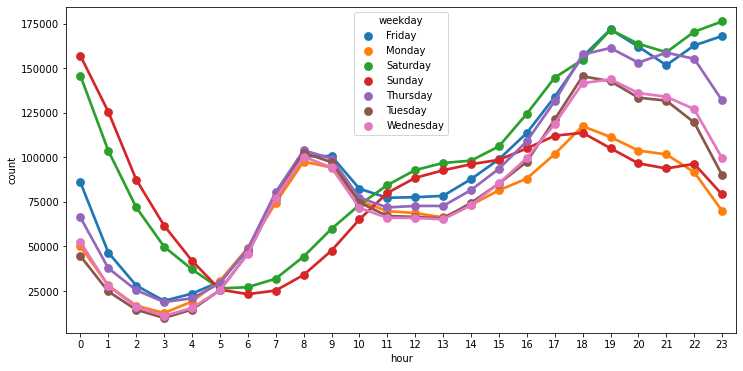

In [196]:
plt.figure(figsize = (12,6))
sns.pointplot(x = 'hour', y = 'count', hue = 'weekday', data = rush)

In [198]:
uber_foil = pd.read_csv(r'D:\DA proj files\Uber Analysis/Uber-Jan-Feb-FOIL.csv')
uber_foil.head()

,dispatching_base_number,date,active_vehicles,trips
0,B02512,1/1/2015,190,1132
1,B02765,1/1/2015,225,1765
2,B02764,1/1/2015,3427,29421
3,B02682,1/1/2015,945,7679
4,B02617,1/1/2015,1228,9537


In [199]:
uber_foil.shape

(354, 4)

## ANALYSING WHICH BASE NUMBER HAS MOS ACTIVE VEHICLES

In [200]:
uber_foil['dispatching_base_number'].unique()

array(['B02512', 'B02765', 'B02764', 'B02682', 'B02617', 'B02598'],
      dtype=object)

<AxesSubplot:xlabel='dispatching_base_number', ylabel='active_vehicles'>

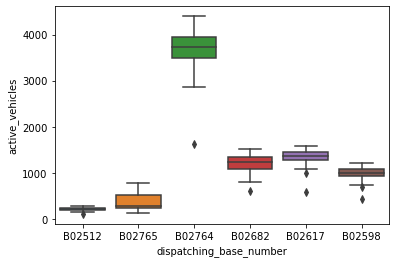

In [201]:
sns.boxplot(x = 'dispatching_base_number', y = 'active_vehicles', data = uber_foil)

In [202]:
## BASE NUMBER WITH MAX. TRIPS

<AxesSubplot:xlabel='dispatching_base_number', ylabel='trips'>

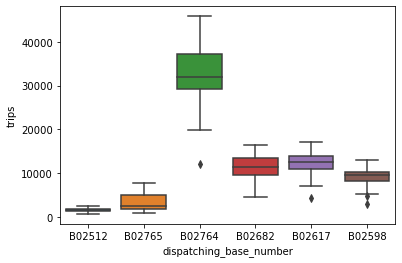

In [203]:
sns.boxplot(x = 'dispatching_base_number', y = 'trips', data = uber_foil)

In [205]:
uber_foil['trips/vehicle'] = uber_foil['trips'] / uber_foil['active_vehicles']
uber_foil.head()

,dispatching_base_number,date,active_vehicles,trips,trips/vehicle
0,B02512,1/1/2015,190,1132,5.957895
1,B02765,1/1/2015,225,1765,7.844444
2,B02764,1/1/2015,3427,29421,8.585060
3,B02682,1/1/2015,945,7679,8.125926
4,B02617,1/1/2015,1228,9537,7.766287


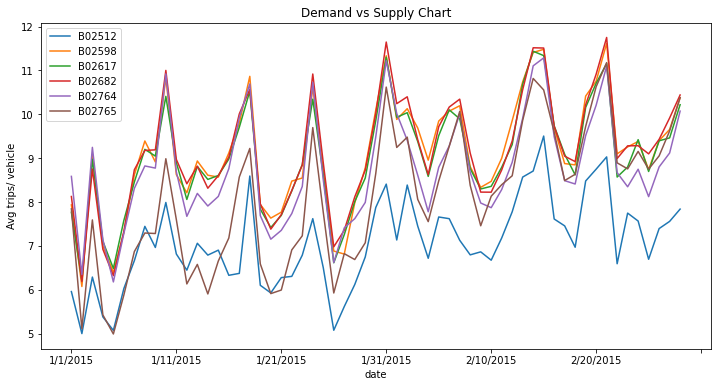

In [208]:
plt.figure(figsize = (12,6))
uber_foil.set_index('date').groupby(['dispatching_base_number'])['trips/vehicle'].plot()
plt.ylabel('Avg trips/ vehicle')
plt.title('Demand vs Supply Chart')
plt.legend()